# Imports

# Data

In [1]:
import numpy as np
import pandas as pd
import os


import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib.gridspec as gridspec

import seaborn as sns
sns.set(style='whitegrid')

%config InteractiveShell.ast_node_interactivity='all'
%config InlineBackend.figure_format = 'svg'

In [2]:
def get_regr_coefficients(coeff_df, wavelength='560', and_mlr_model=False):
    
    """This function extracts the Tecan data regression coefficients and
    them as an array. The simple regresssion coefficient are modified
    for application to the PBR pathlength, while the MLR coefficients are
    return as are."""
    
    ks = coeff_df.loc[wavelength].values[:4]

    
    return ks

def apply_model_basic(pbr_data, Ks, and_mlr_model=False):
    
    """This function applies the models to PBR A680, A720 data and returns a copy of the input
    dataframe and new calculated values. IFF the model hold true, then the values obtained here 
    should match those that are obtained at the the Tecan reader. At the very least the ratios
    should match.
    """
    tdf = pbr_data.copy()
    
    if and_mlr_model == False:

        tdf['B_p' ] = (Ks[1]*tdf['A750c'] - Ks[3]*tdf['A680c']) / (Ks[1]*Ks[2] - Ks[3]*Ks[0])
        tdf['C_p' ] = (Ks[0]*tdf['A750c'] - Ks[2]*tdf['A680c']) / (Ks[0]*Ks[3] - Ks[2]*Ks[1])
        tdf['SS_p'] = tdf['B_p'] + tdf['C_p']
        tdf['B/C_p'] = tdf['B_p'] / tdf['C_p']
    
    return tdf

In [3]:
def get_corr_params(file_loc, model='A680_A750_560'):
    
    print(model)
    
    df = pd.read_csv(file_loc, index_col=0, engine='python')
    
    return df.loc[model].values



def  corr_func_Bsc(pB, pC, parameters, which_a2=None):
    
    # There are 3 options about which a2 to use,
    # a2 refers to the breadth of the correcting
    # parabola. These are either the:
        # mean
        # median
        # a2 @ [B]= 0 (Row12)
    
    
    a2s = parameters[:-2]
    hfit = parameters[-2:]
    # WHICH Parabolic BREADTH to use for correction
    if which_a2 =='mean':
        a2 = np.mean(a2s) # this is the mean
        
    elif which_a2 =='median':
        a2 = np.median(a2s) # this should be more robust to outliers
    
    # set as default
    else:
        a2 = -0.499525586 #global over 3 models... also this has the effect
        # of 'canceling out' the need for 'b' as 

    # given the fitted line avove, use poly1d to create a 
    # prediction function
    htor = np.poly1d(hfit)
    
    # takes in the predicted pB and spits out h in (h, k) the parabola
    # that lives at this pB... i.e. vertex is at (h,pB)
    lH = htor(pB)
    
    
    # IMPORTANT #
    # this is from an algebraic manipulation of the parabolic function
    # in polynomial and parabolic form where h = -b/2*a2 --- since we
    # "know: a2 and p_h is dependant on the concetration of B we 
    # estimate the likely value of b in f(x) = a2*x^2 + b*x + c
    b = np.multiply(-2*lH,a2 )    
    cv_tor = np.poly1d([a2, b, 0])
    
    return cv_tor(pC)

# Load & Model PreProcessed 

In [4]:
# screen 4 folder
s4_pp = '../data_o/screens/screens_preprocessed_data/'
csv_list = [f for f in os.listdir(s4_pp) if 'sc4' in f]
csv_list
sc_c ,b_c,  b = [pd.read_csv(os.path.join(s4_pp, i), index_col=0) for i in csv_list]

# Model Predictions

### SLR

# models
params_slr= '../data_o/calibration/community_calibration/created_models/a680_a750_coefficients.csv' 
slr = pd.read_csv(params_slr, index_col=0)

ks = get_regr_coefficients(slr, '560')

sc_c, b_c,  b = [apply_model_basic(i, ks, False) for i in [sc_c ,b_c, b]]

['sc4_non_supernatant_test_ratios_condition_sc+c.csv',
 'sc4_non_supernatant_test_ratios_condition_b+c.csv',
 'sc4_supernatant_test_ratio_control.csv']

# Spread of Predicted Values

In [5]:
# for df in [sc_c, b_c, b]:
#     df[['B_p', 'C_p']].plot(kind='hist', bins=50)

In [6]:
sc_c[(sc_c['B_p']>0.04) & (sc_c['B_p']< 0.05) &  (sc_c['C_p']>0.03)].describe()

,t(h),replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
count,3.000000,3.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
mean,30.000000,1.0,0.204067,0.095053,0.168200,0.060133,0.045715,0.034732,0.080447,1.321337
std,36.055513,0.0,0.008193,0.008193,0.005027,0.005027,0.004196,0.003617,0.006718,0.125874
min,0.000000,1.0,0.194700,0.085687,0.162400,0.054333,0.041582,0.031121,0.072702,1.188720
25%,10.000000,1.0,0.201150,0.092137,0.166650,0.058583,0.043587,0.032922,0.078325,1.262426
50%,20.000000,1.0,0.207600,0.098587,0.170900,0.062833,0.045592,0.034722,0.083947,1.336132
75%,45.000000,1.0,0.208750,0.099737,0.171100,0.063033,0.047782,0.036538,0.084320,1.387646
max,70.000000,1.0,0.209900,0.100887,0.171300,0.063233,0.049971,0.038354,0.084693,1.439160


In [7]:
b[(b['B_p']>0.045) & (b['B_p']< 0.075) & (b['C_p']>0)].describe()

,t(h),replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
count,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
mean,57.000000,1.0,0.152100,0.043344,0.150100,0.037056,0.049332,0.001339,0.050672,39.892880
std,18.384776,0.0,0.002546,0.002546,0.002546,0.002546,0.003989,0.000477,0.003512,17.188910
min,44.000000,1.0,0.150300,0.041544,0.148300,0.035256,0.046511,0.001002,0.048188,27.738485
25%,50.500000,1.0,0.151200,0.042444,0.149200,0.036156,0.047922,0.001171,0.049430,33.815683
50%,57.000000,1.0,0.152100,0.043344,0.150100,0.037056,0.049332,0.001339,0.050672,39.892880
75%,63.500000,1.0,0.153000,0.044244,0.151000,0.037956,0.050743,0.001508,0.051913,45.970077
max,70.000000,1.0,0.153900,0.045144,0.151900,0.038856,0.052153,0.001677,0.053155,52.047275


# Visualizations

# SC + C

In [8]:
sc_c ,b_c,  b = [pd.read_csv(os.path.join(s4_pp, i), index_col=0) for i in csv_list]
sc_c, b_c,  b = [apply_model_basic(i, ks, False) for i in [sc_c ,b_c, b]]


sc_c = sc_c.groupby(by=['t(h)', 'content', 'b_c_ratio']).agg('mean').reset_index()
b_c = b_c.groupby(by=['t(h)',  'content', 'b_c_ratio']).agg('mean').reset_index()
b = b.groupby(by=['t(h)',  'content', 'b_c_ratio']).agg('mean').reset_index()

In [9]:
sc_c.head()
sc_c.tail(10)

b_c.head()
sc_c.tail(10)

b.head()

,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
0,0,BLANK,1.6,1,0.091200,-0.017813,0.097900,-0.010167,-0.005307,-0.008168,-0.013475,1.067652
1,0,BLANK,16,1,0.095167,-0.013847,0.100567,-0.007500,-0.002935,-0.006955,-0.009890,2.552893
2,0,BLANK,160,1,0.097433,-0.011580,0.101200,-0.006867,-0.004212,-0.004922,-0.009134,3.317384
3,0,CHLAMY,1.6,1,0.178233,0.069220,0.133867,0.025800,-0.019900,0.052366,0.032465,-0.383985
4,0,CHLAMY,16,1,0.105033,-0.003980,0.104633,-0.003433,-0.004621,-0.000077,-0.004698,-3.062330


,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
1006,162,ICL_24,160,1,0.147200,0.038187,0.133867,0.025800,0.023221,0.011482,0.034703,2.277784
1007,162,ICL_41,-,1,0.117667,0.008653,0.115667,0.007600,0.010447,-0.000037,0.010410,-3.089802
1008,162,ICL_41,16,1,0.151600,0.042587,0.132133,0.024067,0.011982,0.019887,0.031869,0.598739
1009,162,ICL_41,160,1,0.147400,0.038387,0.130433,0.022367,0.012792,0.016912,0.029704,0.796022
1010,162,ICL_48,-,1,0.120933,0.011920,0.117233,0.009167,0.010540,0.001909,0.012449,-22.117879
1011,162,ICL_48,16,1,0.147900,0.038887,0.129067,0.021000,0.008056,0.019628,0.027684,0.407155
1012,162,ICL_48,160,1,0.142367,0.033353,0.127667,0.019600,0.011605,0.014445,0.026050,0.816393
1013,162,ICL_60,-,1,0.116267,0.007253,0.115900,0.007833,0.013082,-0.002232,0.010849,-6.223531
1014,162,ICL_60,16,1,0.150400,0.041387,0.132500,0.024433,0.014733,0.017755,0.032488,0.838317
1015,162,ICL_60,160,1,0.146900,0.037887,0.134067,0.026000,0.024229,0.010786,0.035015,2.280752


,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
0,0,BLANK,-,1.5,0.099650,-0.009363,0.102058,-0.006008,-0.004754,-0.003294,-0.008048,2.417707
1,0,BLANK,1.6,1.5,0.132350,0.023337,0.127217,0.019150,0.024193,0.001926,0.026119,-2.994774
2,0,BLANK,16,1.5,0.090617,-0.018397,0.096983,-0.011083,-0.007207,-0.007557,-0.014764,4.567421
3,0,BLANK,160,1.5,0.145617,0.036603,0.124333,0.016267,-0.002766,0.023743,0.020977,-18.489387
4,0,CHLAMY,1.6,1.5,0.199600,0.090587,0.134800,0.026733,-0.046830,0.079110,0.032280,-0.528856


,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
1006,162,ICL_24,160,1,0.147200,0.038187,0.133867,0.025800,0.023221,0.011482,0.034703,2.277784
1007,162,ICL_41,-,1,0.117667,0.008653,0.115667,0.007600,0.010447,-0.000037,0.010410,-3.089802
1008,162,ICL_41,16,1,0.151600,0.042587,0.132133,0.024067,0.011982,0.019887,0.031869,0.598739
1009,162,ICL_41,160,1,0.147400,0.038387,0.130433,0.022367,0.012792,0.016912,0.029704,0.796022
1010,162,ICL_48,-,1,0.120933,0.011920,0.117233,0.009167,0.010540,0.001909,0.012449,-22.117879
1011,162,ICL_48,16,1,0.147900,0.038887,0.129067,0.021000,0.008056,0.019628,0.027684,0.407155
1012,162,ICL_48,160,1,0.142367,0.033353,0.127667,0.019600,0.011605,0.014445,0.026050,0.816393
1013,162,ICL_60,-,1,0.116267,0.007253,0.115900,0.007833,0.013082,-0.002232,0.010849,-6.223531
1014,162,ICL_60,16,1,0.150400,0.041387,0.132500,0.024433,0.014733,0.017755,0.032488,0.838317
1015,162,ICL_60,160,1,0.146900,0.037887,0.134067,0.026000,0.024229,0.010786,0.035015,2.280752


,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
0,0,BLANK,b_high,1,0.107833,-0.000922,0.112933,-0.000111,0.000953,-0.001048,-0.000095,-5.344780
1,0,BLANK,b_low,1,0.111767,0.003011,0.114867,0.001822,0.001204,0.001225,0.002428,-3.746534
2,0,BLANK,sc_low-high,1,0.106667,-0.002089,0.111333,-0.001711,-0.002157,-0.000177,-0.002334,-8.875953
3,0,CHLAMY,b_high,1,0.109433,0.000678,0.113467,0.000422,0.000307,0.000258,0.000564,-2.569774
4,0,CHLAMY,b_low,1,0.100433,-0.008322,0.104100,-0.008944,-0.014882,0.002496,-0.012385,-6.706512


In [10]:
sc_c.describe()
b_c.describe()
b.describe()

,t(h),replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
count,1016.000000,1016.0,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000
mean,82.059055,1.0,0.138124,0.029111,0.127144,0.019078,0.015957,0.009641,0.025598,0.452493
std,54.480552,0.0,0.024765,0.024765,0.014912,0.014912,0.017885,0.014590,0.020009,19.211918
min,0.000000,1.0,0.091200,-0.017813,0.097200,-0.010867,-0.030135,-0.025048,-0.014638,-88.755118
25%,38.000000,1.0,0.118567,0.009553,0.117325,0.009258,0.007413,-0.001838,0.012778,-3.062722
50%,84.000000,1.0,0.135283,0.026270,0.126250,0.018183,0.015304,0.004821,0.024225,0.438047
75%,126.750000,1.0,0.154792,0.045778,0.135300,0.027233,0.022196,0.019451,0.036310,1.448820
max,162.000000,1.0,0.300900,0.191887,0.288833,0.180767,0.267832,0.054916,0.248599,256.304309


,t(h),replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
count,1016.000000,1016.0,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000
mean,81.840551,1.5,0.139291,0.030278,0.127023,0.018957,0.013976,0.011362,0.025338,-8.980361
std,54.429510,0.0,0.028005,0.028005,0.018031,0.018031,0.024015,0.016538,0.024352,229.791277
min,0.000000,1.5,0.090617,-0.018397,0.096983,-0.011083,-0.048973,-0.031218,-0.014764,-7143.776952
25%,38.000000,1.5,0.114879,0.005866,0.114538,0.006471,0.004291,-0.001610,0.009107,-2.050779
50%,84.000000,1.5,0.138692,0.029678,0.126667,0.018600,0.010213,0.006282,0.024902,0.215677
75%,125.750000,1.5,0.160137,0.051124,0.136837,0.028771,0.019002,0.022977,0.037882,0.903869
max,162.000000,1.5,0.357617,0.248603,0.346450,0.238383,0.359375,0.085621,0.328157,499.551672


,t(h),replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
count,768.000000,768.0,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,81.375000,1.0,0.119248,0.010492,0.119564,0.006520,0.004698,0.004011,0.008709,-0.678219
std,54.293855,0.0,0.021353,0.021353,0.018485,0.018485,0.030060,0.011618,0.025437,16.679705
min,0.000000,1.0,0.097900,-0.010856,0.099767,-0.013278,-0.222638,-0.045955,-0.018494,-140.764921
25%,37.750000,1.0,0.111458,0.002703,0.113225,0.000181,-0.004410,0.001143,-0.000027,-2.636663
50%,83.500000,1.0,0.115700,0.006944,0.116983,0.003939,0.001050,0.002988,0.005293,-0.688972
75%,125.000000,1.0,0.120667,0.011911,0.121267,0.008222,0.008444,0.005212,0.011162,1.443669
max,161.000000,1.0,0.399933,0.291178,0.391567,0.278522,0.418894,0.219597,0.383361,239.157147


# Without Corrections

In [11]:
def quickplot(dframe, kind, title, path):
    
    
    l = len(dframe['content'].unique())
    
    # Figure Settings

    axes = []
   
    if kind == 'NS' or kind == 'NScr':
        ratio = ['b_high', 'b_low', 'sc_low-high']
        fig, ax = plt.subplots(nrows=l, ncols=3, figsize=(12,60))
        gs = gridspec.GridSpec(l,3)
        
        for r in range(0,l):
            for c in [0,1,2]:
                axes.append(plt.subplot(gs[r,c]))
    else:
        
        ratio = ['1.6', '16', '160', '-']
        
        
        fig, ax = plt.subplots(nrows=l, ncols=4, figsize=(12,60))
        gs = gridspec.GridSpec(l,4)
        
        for r in range(0,l):
            for c in [0,1,2,3]:
                axes.append(plt.subplot(gs[r,c]))
    
    axes = (ax for ax in axes)
    
    

    
    # Loop through each Strain    
    for cont in dframe['content'].unique():
        
        #print(cont)
        #break
        try:

            component = ['C_p', 'B_p']


            df = dframe[dframe['content']==cont]

            #print(df)
            #wells = df['well'].unique()
            

            ax = next(axes)
            df[df['b_c_ratio']==ratio[2]].plot(x='t(h)',
                        y=component, ax=ax,  style=['g-*', 'r-.'], legend=False)

            ax.set_title(kind+' @ ratio: '+ratio[2])
            ax.set_ylabel('['+cont+'] & [C]')
            ax.set_ylim(bottom=-0.03, top=.10)



            ax = next(axes)
            df[df['b_c_ratio']==ratio[1]].plot(x='t(h)',
                        y=component, ax=ax,  style=['g-*', 'r-.'], legend=False)
            
            ax.set_title(kind+' @ ratio: '+ratio[1])
            ax.set_ylim(bottom=-0.03, top=.10)



            ax=next(axes)
            df[df['b_c_ratio']==ratio[0]].plot(x='t(h)',
                        y=component, ax=ax,  style=['g-*', 'r-.'], legend=False)
            
            ax.set_title(kind+' @ ratio '+ratio[0])
            ax.set_ylim(bottom=-0.03, top=.10)



            if len(ratio)>3:

                # SC only
                ax=next(axes)
                df[df['b_c_ratio']==ratio[-1]].plot(x='t(h)',
                        y=component, ax=ax,  style=['g-*', 'r-.'], legend=False)

                ax.set_title('['+cont+'] @ ratio '+ratio[-1])
                ax.set_ylim(bottom=-0.03, top=.10)



        
        except:
        
            continue
    plt.tight_layout()
    fig.suptitle(title, y=1.01)        
    plt.tight_layout()
    fig.savefig(os.path.join(path,title), format='svg')
    
    return fig

In [12]:
# Save Figs to Supplementary
path = '../data_o/supplementary_info/'

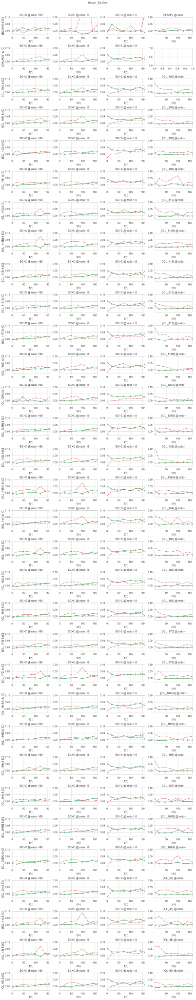

In [13]:
scfig=quickplot(sc_c, kind='SC+C', title='Uncorr_SynCom', path=path)

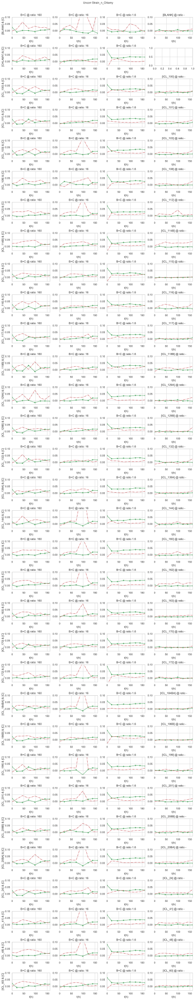

In [14]:
bcfig=quickplot(b_c, kind='B+C', title='Uncorr Strain_n_Chlamy', path=path)

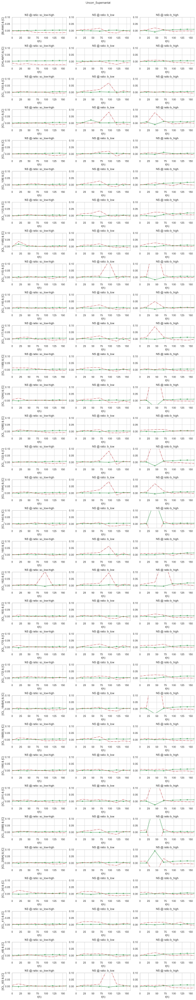

In [15]:
bfig=quickplot(b, kind='NS', title='Uncorr_Supernantat', path=path)

# Signal Correction Version

In [16]:
  ##### CORRECTING #####
    
    # CORRECT pB
    # use the uncorrected values to correct these 

corpars_path = '../data_o/calibration/community_calibration/created_models/reqd_corr_funcs_parameters.csv'
parameters = get_corr_params(corpars_path, 'A680_A750_560')

A680_A750_560


In [17]:
parameters
sc_c.head()

array([-0.34812335, -0.50772402, -0.75938293, -0.66045527, -0.58189167,
       -0.48887538, -0.42377174, -0.60537192, -0.40676932,  0.37882317])

,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p
0,0,BLANK,1.6,1,0.091200,-0.017813,0.097900,-0.010167,-0.005307,-0.008168,-0.013475,1.067652
1,0,BLANK,16,1,0.095167,-0.013847,0.100567,-0.007500,-0.002935,-0.006955,-0.009890,2.552893
2,0,BLANK,160,1,0.097433,-0.011580,0.101200,-0.006867,-0.004212,-0.004922,-0.009134,3.317384
3,0,CHLAMY,1.6,1,0.178233,0.069220,0.133867,0.025800,-0.019900,0.052366,0.032465,-0.383985
4,0,CHLAMY,16,1,0.105033,-0.003980,0.104633,-0.003433,-0.004621,-0.000077,-0.004698,-3.062330


In [18]:
for df in [sc_c, b_c, b]:
    
    df['B_o'] = df['B_p'].copy()
    df['cv'] = df.apply(lambda x: corr_func_Bsc(x['B_p'], x['C_p'], parameters,
                                                which_a2=None), axis=1)
    df['B_p'] = df['B_o'] - df['cv']

In [19]:
for df in [sc_c, b_c, b]:
    df.head(8)

,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p,B_o,cv
0,0,BLANK,1.6,1,0.091200,-0.017813,0.097900,-0.010167,-0.002165,-0.008168,-0.013475,1.067652,-0.005307,-0.003142
1,0,BLANK,16,1,0.095167,-0.013847,0.100567,-0.007500,-0.000270,-0.006955,-0.009890,2.552893,-0.002935,-0.002665
2,0,BLANK,160,1,0.097433,-0.011580,0.101200,-0.006867,-0.002328,-0.004922,-0.009134,3.317384,-0.004212,-0.001883
3,0,CHLAMY,1.6,1,0.178233,0.069220,0.133867,0.025800,-0.038773,0.052366,0.032465,-0.383985,-0.019900,0.018872
4,0,CHLAMY,16,1,0.105033,-0.003980,0.104633,-0.003433,-0.004592,-0.000077,-0.004698,-3.062330,-0.004621,-0.000029
5,0,CHLAMY,160,1,0.099333,-0.009680,0.101900,-0.006167,-0.003455,-0.003473,-0.008255,1.640681,-0.004782,-0.001327
6,0,ICL_100,1.6,1,0.173167,0.064153,0.129933,0.021867,-0.043205,0.051610,0.027120,-0.474486,-0.024490,0.018716
7,0,ICL_100,16,1,0.101967,-0.007047,0.101033,-0.007033,-0.011501,0.001301,-0.009703,-2.580780,-0.011004,0.000497


,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p,B_o,cv
0,0,BLANK,-,1.5,0.099650,-0.009363,0.102058,-0.006008,-0.003496,-0.003294,-0.008048,2.417707,-0.004754,-0.001258
1,0,BLANK,1.6,1.5,0.132350,0.023337,0.127217,0.019150,0.023485,0.001926,0.026119,-2.994774,0.024193,0.000708
2,0,BLANK,16,1.5,0.090617,-0.018397,0.096983,-0.011083,-0.004296,-0.007557,-0.014764,4.567421,-0.007207,-0.002911
3,0,BLANK,160,1.5,0.145617,0.036603,0.124333,0.016267,-0.011497,0.023743,0.020977,-18.489387,-0.002766,0.008731
4,0,CHLAMY,1.6,1.5,0.199600,0.090587,0.134800,0.026733,-0.075149,0.079110,0.032280,-0.528856,-0.046830,0.028319
5,0,CHLAMY,16,1.5,0.098533,-0.010480,0.098267,-0.009800,-0.014774,0.000941,-0.013472,55.200222,-0.014413,0.000361
6,0,CHLAMY,160,1.5,0.123933,0.014920,0.118100,0.010033,0.007236,0.004557,0.013491,6.992076,0.008933,0.001698
7,0,ICL_100,-,1.5,0.104267,-0.004747,0.102850,-0.005217,-0.009437,0.001597,-0.007231,0.213580,-0.008828,0.000609


,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p,B_o,cv
0,0,BLANK,b_high,1,0.107833,-0.000922,0.112933,-0.000111,0.001350,-0.001048,-0.000095,-5.344780,0.000953,-0.000397
1,0,BLANK,b_low,1,0.111767,0.003011,0.114867,0.001822,0.000742,0.001225,0.002428,-3.746534,0.001204,0.000462
2,0,BLANK,sc_low-high,1,0.106667,-0.002089,0.111333,-0.001711,-0.002089,-0.000177,-0.002334,-8.875953,-0.002157,-0.000067
3,0,CHLAMY,b_high,1,0.109433,0.000678,0.113467,0.000422,0.000209,0.000258,0.000564,-2.569774,0.000307,0.000097
4,0,CHLAMY,b_low,1,0.100433,-0.008322,0.104100,-0.008944,-0.015838,0.002496,-0.012385,-6.706512,-0.014882,0.000957
5,0,CHLAMY,sc_low-high,1,0.102633,-0.006122,0.106033,-0.007011,-0.013172,0.002485,-0.009737,-5.057438,-0.012222,0.000950
6,0,ICL_100,b_high,1,0.109467,0.000711,0.114167,0.001122,0.002614,-0.000752,0.001578,-2.942544,0.002330,-0.000284
7,0,ICL_100,b_low,1,0.107333,-0.001422,0.109800,-0.003244,-0.008760,0.003009,-0.004608,-3.795702,-0.007616,0.001143


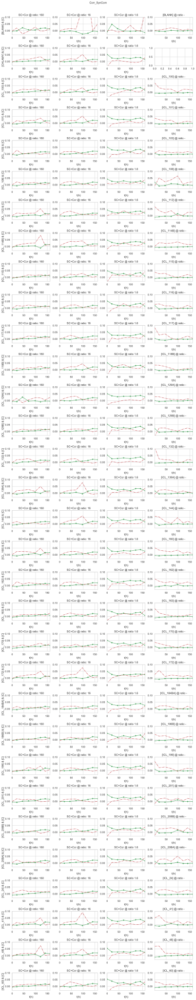

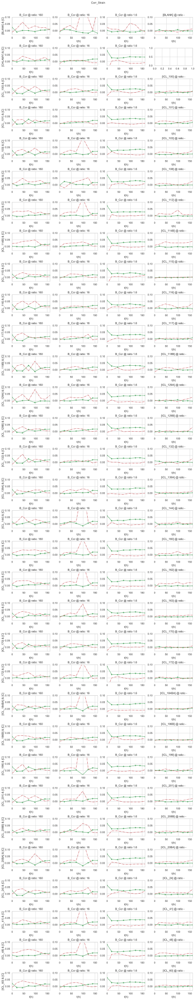

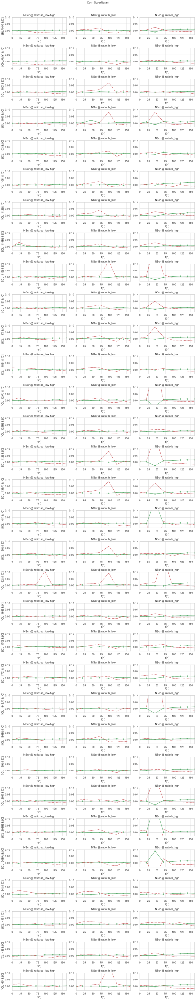

In [20]:
corscfig=quickplot(sc_c, 'SC+Ccr', title='Corr_SynCom', path=path)

corrbcfig=quickplot(b_c, 'B_Ccr', title='Corr_Strain', path=path)

corrbfig=quickplot(b, 'NScr', title='Corr_SuperNatant', path=path)

In [21]:
def quickplot2(dframe, dframe2, title, path, kind=None):
    
    
    l = len(dframe['content'].unique())
    l2 = len(dframe2['content'].unique())
    print('l, l2', l, l2)
    
    # Figure Settings
    axes = []

    fig, ax = plt.subplots(nrows=l, ncols=4, figsize=(12,60))
    gs = gridspec.GridSpec(l,4)

    for r in range(0,l):
        for c in [0,1,2,3]:
            axes.append(plt.subplot(gs[r,c]))
    
    axes = (ax for ax in axes)
        
    # Loop through each Strain
    ratio = ['1.6', '16', '160', '-']
    component = ['C_p', 'B_p']
    
    for cont in dframe['content'].unique():
        
        try:


            df = dframe[dframe['content']==cont]
            df2 = dframe2[dframe2['content']==cont]


            ax = next(axes)
            df[df['b_c_ratio']==ratio[2]].plot(x='t(h)',
                        y=component, ax=ax,  style=['g-*', 'r-.'], legend=False)
            df2[df2['b_c_ratio']==ratio[2]].plot(x='t(h)',
                        y=component, ax=ax,  style=['c-*', 'm-.'], legend=False)
            
            ax.set_title('SC_C v. B_C @ ratio: '+ratio[2])
            ax.set_ylabel('['+cont+'] & [C]')
            ax.set_ylim(bottom=-0.02, top=.1)


            ax = next(axes)
            df[df['b_c_ratio']==ratio[1]].plot(x='t(h)',
                        y=component, ax=ax,  style=['g-*', 'r-.'], legend=False)
            df2[df2['b_c_ratio']==ratio[1]].plot(x='t(h)',
                        y=component, ax=ax,  style=['c-*', 'm-.'], legend=False)
            
            ax.set_title('SC_C v. B_C @ ratio: '+ratio[1])
            ax.set_ylim(bottom=-0.02, top=.1)


            ax=next(axes)
            df[df['b_c_ratio']==ratio[0]].plot(x='t(h)',
                        y=component, ax=ax,  style=['g-*', 'r-.'], legend=False)
            df2[df2['b_c_ratio']==ratio[0]].plot(x='t(h)',
                        y=component, ax=ax,  style=['c-*', 'm-.'], legend=False)
            
            ax.set_title('SC_C v. B_C @ ratio '+ratio[0])
            ax.set_ylim(bottom=-0.02, top=.1)


            ax=next(axes)
            df[df['b_c_ratio']==ratio[-1]].plot(x='t(h)',
                    y=component, ax=ax,  style=['g-*', 'r-.'], legend=False)
            
            #df2[df2['b_c_ratio']==ratio[-1]].plot(x='t(h)',
            #        y=component, ax=ax,  style=['c-*', 'm-.'], legend=False)

            ax.set_title('SC_C v. B_C @ ratio '+ratio[-1])
            ax.set_ylim(bottom=-0.02, top=.1)



        
        except:
        
            continue
            
            
    fig.suptitle(title, y=1.01)        
    plt.tight_layout()
    fig.savefig(os.path.join(path,title), format='svg')
    
    return fig

l, l2 32 32


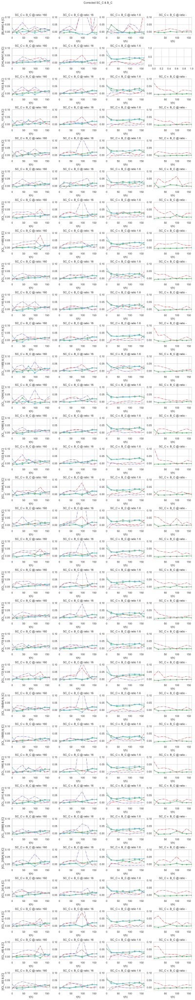

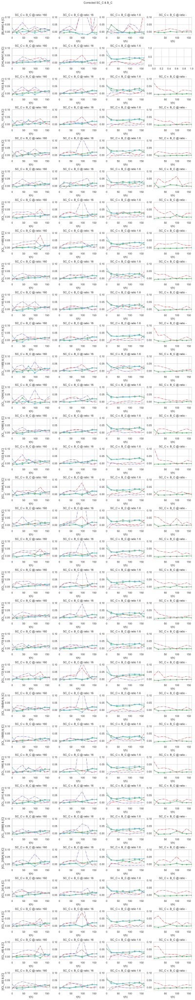

In [22]:
quickplot2(sc_c, b_c, 'Corrected SC_C & B_C', path=path)

In [23]:
sc_c.head(10)
b_c.head(10)

,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p,B_o,cv
0,0,BLANK,1.6,1,0.091200,-0.017813,0.097900,-0.010167,-0.002165,-0.008168,-0.013475,1.067652,-0.005307,-0.003142
1,0,BLANK,16,1,0.095167,-0.013847,0.100567,-0.007500,-0.000270,-0.006955,-0.009890,2.552893,-0.002935,-0.002665
2,0,BLANK,160,1,0.097433,-0.011580,0.101200,-0.006867,-0.002328,-0.004922,-0.009134,3.317384,-0.004212,-0.001883
3,0,CHLAMY,1.6,1,0.178233,0.069220,0.133867,0.025800,-0.038773,0.052366,0.032465,-0.383985,-0.019900,0.018872
4,0,CHLAMY,16,1,0.105033,-0.003980,0.104633,-0.003433,-0.004592,-0.000077,-0.004698,-3.062330,-0.004621,-0.000029
5,0,CHLAMY,160,1,0.099333,-0.009680,0.101900,-0.006167,-0.003455,-0.003473,-0.008255,1.640681,-0.004782,-0.001327
6,0,ICL_100,1.6,1,0.173167,0.064153,0.129933,0.021867,-0.043205,0.051610,0.027120,-0.474486,-0.024490,0.018716
7,0,ICL_100,16,1,0.101967,-0.007047,0.101033,-0.007033,-0.011501,0.001301,-0.009703,-2.580780,-0.011004,0.000497
8,0,ICL_100,160,1,0.096433,-0.012580,0.100167,-0.007900,-0.004082,-0.004685,-0.010562,1.878733,-0.005877,-0.001795
9,0,ICL_101,1.6,1,0.173000,0.063987,0.128967,0.020900,-0.046303,0.052845,0.025729,-0.512274,-0.027116,0.019187


,t(h),content,b_c_ratio,replicate,A680,A680c,A750,A750c,B_p,C_p,SS_p,B/C_p,B_o,cv
0,0,BLANK,-,1.5,0.099650,-0.009363,0.102058,-0.006008,-0.003496,-0.003294,-0.008048,2.417707,-0.004754,-0.001258
1,0,BLANK,1.6,1.5,0.132350,0.023337,0.127217,0.019150,0.023485,0.001926,0.026119,-2.994774,0.024193,0.000708
2,0,BLANK,16,1.5,0.090617,-0.018397,0.096983,-0.011083,-0.004296,-0.007557,-0.014764,4.567421,-0.007207,-0.002911
3,0,BLANK,160,1.5,0.145617,0.036603,0.124333,0.016267,-0.011497,0.023743,0.020977,-18.489387,-0.002766,0.008731
4,0,CHLAMY,1.6,1.5,0.199600,0.090587,0.134800,0.026733,-0.075149,0.079110,0.032280,-0.528856,-0.046830,0.028319
5,0,CHLAMY,16,1.5,0.098533,-0.010480,0.098267,-0.009800,-0.014774,0.000941,-0.013472,55.200222,-0.014413,0.000361
6,0,CHLAMY,160,1.5,0.123933,0.014920,0.118100,0.010033,0.007236,0.004557,0.013491,6.992076,0.008933,0.001698
7,0,ICL_100,-,1.5,0.104267,-0.004747,0.102850,-0.005217,-0.009437,0.001597,-0.007231,0.213580,-0.008828,0.000609
8,0,ICL_100,1.6,1.5,0.198017,0.089003,0.148533,0.040467,-0.023860,0.056357,0.052332,0.078208,-0.004025,0.019835
9,0,ICL_100,16,1.5,0.105417,-0.003597,0.106933,-0.001133,0.002797,-0.003033,-0.001386,-2.090922,0.001647,-0.001150
